In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [ ]:
class PrettyImage:
    def __init__(self, img):
        if type(img) == str:
            img = Image.open(img)
            self.arr = np.asarray(img)
            
        else:
            self.arr = img
        if len(self.arr.shape)<3:

            self.arr = self.arr.reshape((self.arr.shape[0],self.arr.shape[1], 1))
        self.arr = self.arr.astype(np.uint8)


    def to_gray(self):
        return PrettyImage((self.arr.sum(axis=2)//3).astype(np.uint8))

    def to_n_bit(self, bits = 4):
        return PrettyImage((self.arr//(2**bits))*((2**bits)+1))

    def threshold(self, limit=None, ratio=None):

        if ratio:
            limit = self.arr.max()//ratio
        if limit is None and ratio is None:
            limit = self.arr.max()//2

        arrthreshold = np.where(self.arr > limit, self.arr, 255)
        arrthreshold = np.where(self.arr < limit , arrthreshold, 0)

        return PrettyImage(arrthreshold)

    def scale(self, x, y, channels=1):

        xi, yi, channels = self.arr.shape
        new = np.zeros((x,y,channels), dtype=np.uint8)

        for i in range(x):
            for j in range(y):
                for k in range(channels):
                
                    new[i,j,k] = self.arr[int((xi/x)*i), int((yi/y)*j), k]
            
        return PrettyImage(new)

    def rotate(self, theta, pivot = None):
        theta =  np.radians(theta)

        rotmat = np.array([[np.cos(theta), -np.sin(theta)],
                            [np.sin(theta) , np.cos(theta)]])
        x, y, channels = self.arr.shape
        if pivot is None:
            pivot = np.array([x//2,y//2])
        padx = int((((x**2)+(y**2))**(1/2))*1.5)
        pady = padx
        new = np.zeros((padx,pady, channels), dtype=np.uint8)
        for i in range(x):
            for j in range(y):
                for k in range(channels):
                    newx , newy = (np.dot(rotmat, np.array([i,j]))-pivot)
                    new[int(newx),int(newy),k] = self.arr[i,j,k]
                
        return  PrettyImage(new)

    def linear_transformation(self,src, a): #https://mmas.github.io/linear-transformations-numpy#:~:text=Applying%20a%20geometric%20transformation%20to,matrix%20to%20the%20new%20indices.
        M, N = src.shape
        points = np.mgrid[0:N, 0:M].reshape((2, M*N))
        new_points = np.linalg.inv(a).dot(points).round().astype(int)
        x, y = new_points.reshape((2, M, N), order='F')
        indices = x + N*y
        return np.take(src, indices, mode='wrap')


    def rotate_new(self, theta):
        theta = np.radians(theta)
        rotmat = np.array([[np.cos(theta), -np.sin(theta)],
                        [np.sin(theta) , np.cos(theta)]])
        
        x,y,channels = self.arr.shape

        new_mat = []
        for c in range(channels):
            dst = self.linear_transformation(self.arr[:,:,c], rotmat)

        new_mat.append(dst)
        
        return PrettyImage(np.moveaxis(np.array(new_mat),0,-1))

    def rotate_new_new(self, theta): #https://gautamnagrawal.medium.com/rotating-image-by-any-angle-shear-transformation-using-only-numpy-d28d16eb5076
        theta = np.radians(theta)
        x,y,channels = self.arr.shape

        newx = int(abs(x*np.cos(theta))+abs(y*np.sin(theta)))+1
        newy = int(abs(y*np.cos(theta))+abs(x*np.sin(theta)))+1
        new = np.zeros((newx, newy, channels))
        centerx =  round(((x+1)/2)-1)
        centery =  round(((y+1)/2)-1)
        new_centerx = round(((newx+1)/2)-1) 
        new_centery = round(((newy+1)/2)-1)   
        for i in range(x):
            for j in range(y):
                ty=x-1-i-centerx              
                tx=y-1-j-centery                    

                new_y=round(-tx*np.sin(theta) + ty*np.cos(theta))
                new_x=round(tx*np.cos(theta) + ty*np.sin(theta))
                new_y=new_centerx-new_y
                new_x=new_centery-new_x
                new[new_y,new_x,:]=self.arr[i,j,:]  
        return PrettyImage(new)

    def __sub__(self, img):
        if img.arr.shape!=self.arr.shape:
            img = img.scale(self.arr.shape[0], self.arr.shape[1])
        return PrettyImage((self.arr+img.arr))

    def __add__(self, img):
        if img.arr.shape!=self.arr.shape:
            img = img.scale(self.arr.shape[0], self.arr.shape[1])
        return PrettyImage((self.arr+img.arr))      


    def as_img(self):
        arr = self.arr
        if arr.shape[-1]==1:
            arr = arr.reshape(arr.shape[0], arr.shape[1])
        return Image.fromarray(arr)

    def hist(self,  nbins=32):
        x,y, channels = self.arr.shape
        colors = ["red","green","blue"]
        for channel in range(channels):
        
            plt.hist(np.ravel(self.arr[:,:,channel]), bins=nbins, color=colors[channel%len(colors)])
            
    def cumulative(self):
        x,y,channels = self.arr.shape
        cums = []
        for channel in range(channels):
            unique, counts = np.unique(self.arr[:,:,channel], return_counts=True)
            d = dict(zip(unique, counts))
            t = [0]*256
            
            for i in range(256):
                
                t[i] = d.get(i,0)
            cums.append(np.array(t).cumsum())
        return np.array(cums)
        
    def plot_cumulative(self):
        colors = ["red","green","blue"]
        cums = self.cumulative()
        for i,c in enumerate(cums):
            plt.plot(list(range(len(c))), c, color = colors[i%3])

    def contrast(self):
        x,y,channels = self.arr.shape
        new = np.zeros(self.arr.shape)
       
        for channel in range(channels):
            arr = self.arr[:,:,channel]
            min_ = arr.min()
            max_ = arr.max()
            t = ((arr-min_)/(max_-min_))*255
            new[:,:,channel] = t
        return PrettyImage(new)
    def closest(self,array, value):
        idx = (np.abs(array - value)).argmin()
        
        return idx
    def match(self, img):
        if img.arr.shape!=self.arr.shape:
            img = img.scale(self.arr.shape[0], self.arr.shape[1])
        F1 = self.cumulative()/self.arr.size
        F2 = img.cumulative()/self.arr.size
        
        x,y,channels = self.arr.shape
        new = np.zeros(self.arr.shape)
        for i in range(x):
            for j in range(x):
                for channel in range(channels):
                   
                    new[i,j,channel] = self.closest(F2[channel], F1[channel][self.arr[i,j,channel]])
        return PrettyImage(new)

    def tanh_transform(self, r = 128, scale=0.5):

        arr = self._t_tanh(self.arr, r, scale, normalize=True)
     
        return PrettyImage(arr)

    def xstep_transform(self,r=255,b1=0.1,b2=11):
        arr = self._xstep(self.arr,r,b1,b2,normalize=True)
        return PrettyImage(arr)

    def equalize(self, k =128,  number_bins=256):  #https://stackoverflow.com/questions/28518684/histogram-equalization-of-grayscale-images-with-numpy
        """cums = self.cumulative()/255

        ncums = (cums+1)*k
        new = np.interp(sel)"""
        x,y,channels = self.arr.shape
        new = np.zeros(self.arr.shape)
        for channel in range(channels):
            arr = self.arr[:,:,channel]
            image_histogram, bins = np.histogram(arr.flatten(), number_bins, density=True)
            cdf = image_histogram.cumsum() 
            cdf = (number_bins-1) * cdf / cdf[-1] 

        
            image_equalized = np.interp(arr.flatten(), bins[:-1], cdf)
            t = image_equalized.reshape(arr.shape)
            new[:,:,channel] = t

        return PrettyImage(new)



    @staticmethod
    def noise_uniform(shape):
        noise = np.random.randint(0,255, shape)
        return PrettyImage(noise)

    def uniform_match(self): #somewhat ... equalization ... ???
        noise = PrettyImage.noise_uniform(self.arr.shape)
        return self.match(noise)




    @staticmethod
    def _t_tanh(arr, r=255, scale=0.5, normalization = None):
        if normalization is True:
            arr = arr/r
        arr = (((arr/scale)-1)*2)
        arr = (np.tanh(arr)+1)/2
         
        if normalization is True:
            arr = (arr*r)
        return arr

    @staticmethod
    def _xstep(arr, r=255, b1=0.1, b2=11, normalization = False):
     
        if normalization is True:
            arr = arr/r 
 
        arr = ((arr/b1)-np.sin(arr/b1))/b2
   
        if normalization is True:
            arr = (arr*r)
        return arr
    
    def apply_normalized_function(self, f, *args, **kwargs):
        arr = f(self.arr, *args, **kwargs)
        return PrettyImage((arr/arr.max())*255)



    
    

    


lena_color = PrettyImage("lena_color.jpg")
fruit_color = PrettyImage("fruit.jpg")
fruit = fruit_color.to_gray()
lena = lena_color.to_gray()

En la ecualización y en la expansión de contraste se aplica una transformación que busca modificar el histograma de una imagen. En ambas técnicas se amplía la varianza de los histogramas. En el caso de la imagen "Lena" la equalización hace que la imagen parezca menos rojiza y se vea algo más natural. La expansión de contraste tiene un efecto similar, haciendo colores como el azul más relevantes, pero aún se nota un tono rojizo más prevalente. En las siguientes imagenes se puede apreciar el efecto que distintas transformaciones tienen.


Las transformaciones son auto explicativas

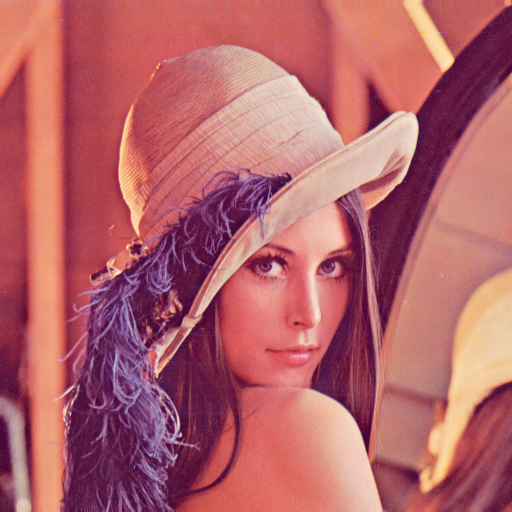

In [ ]:
lena_color.as_img()

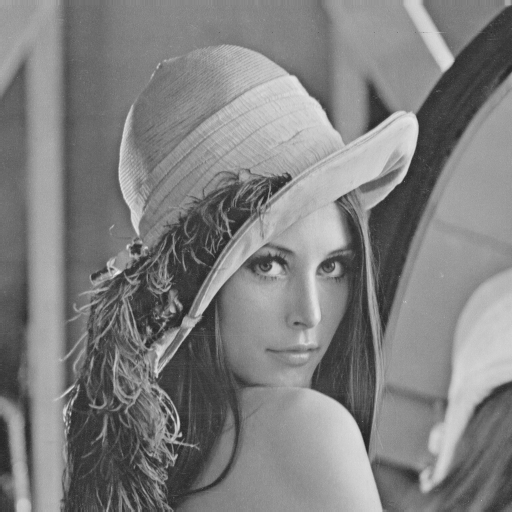

In [ ]:
lena.as_img()

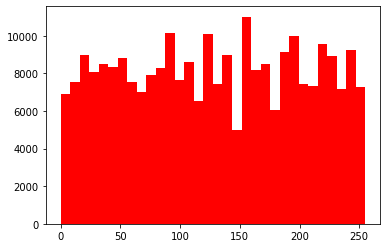

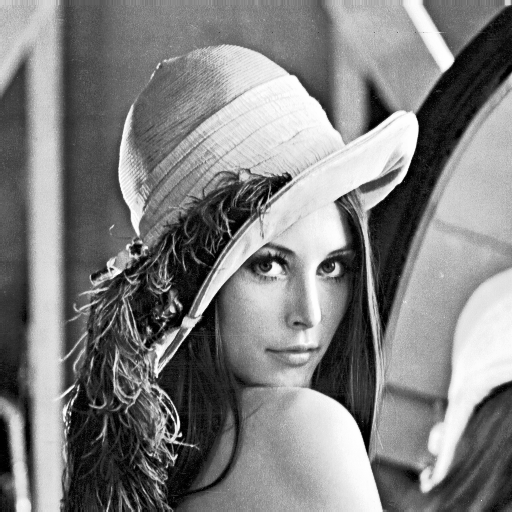

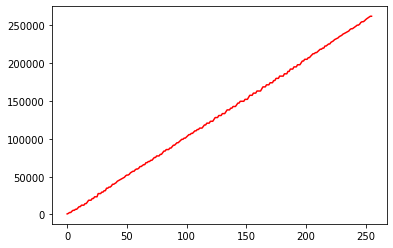

In [ ]:
lena.equalize().hist()
plt.show()
lena.equalize().plot_cumulative()
lena.equalize().as_img()

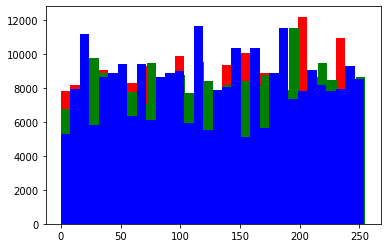

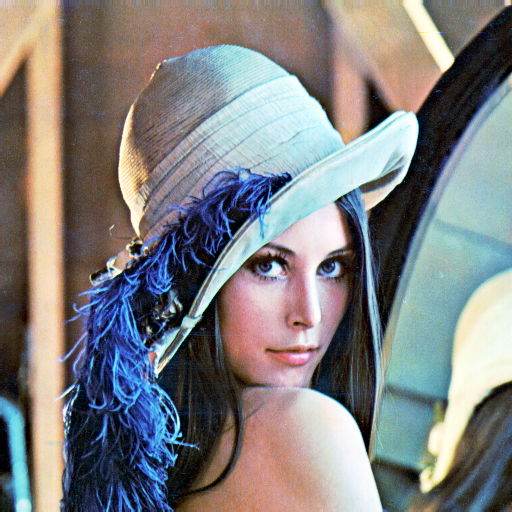

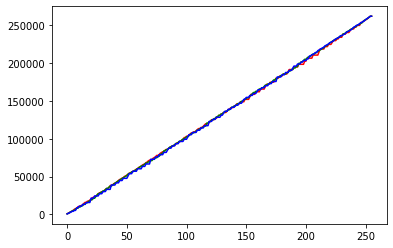

In [ ]:
lena_color.equalize().hist()
plt.show()
lena_color.equalize().plot_cumulative()
lena_color.equalize().as_img()

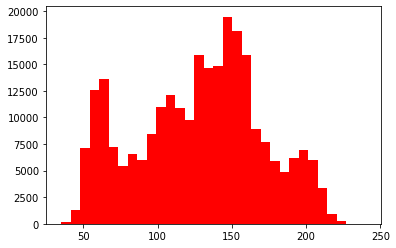

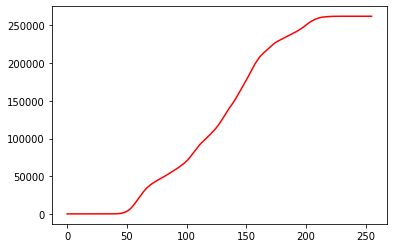

In [ ]:
lena.hist()
plt.show()
lena.plot_cumulative()

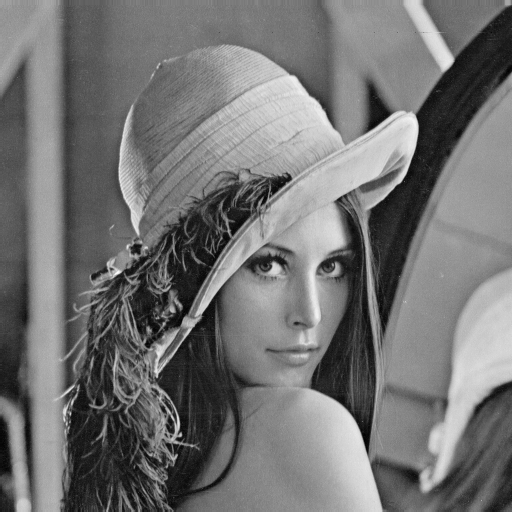

In [ ]:
lena.contrast().as_img()

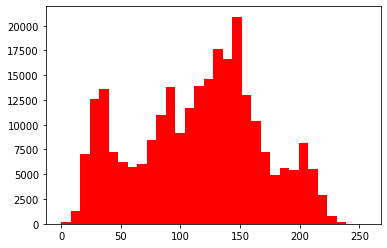

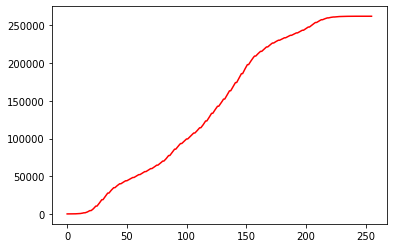

In [ ]:
lena.contrast().hist()
plt.show()
lena.contrast().plot_cumulative()

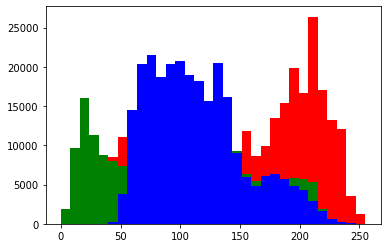

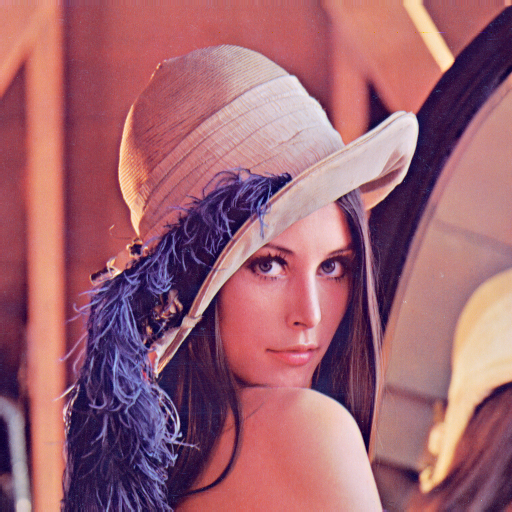

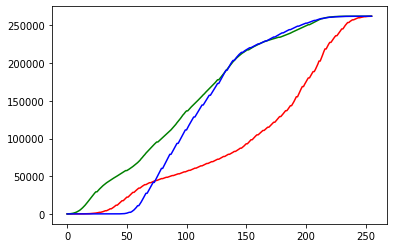

In [ ]:
lena_color.contrast().hist()
plt.show()
lena_color.contrast().plot_cumulative()
lena_color.contrast().as_img()

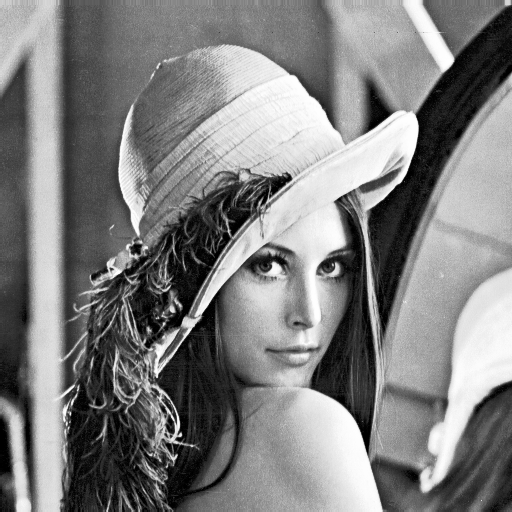

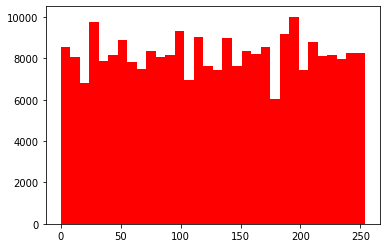

In [ ]:
lena_uniform = lena.uniform_match()

lena_uniform.hist()
lena_uniform.as_img()

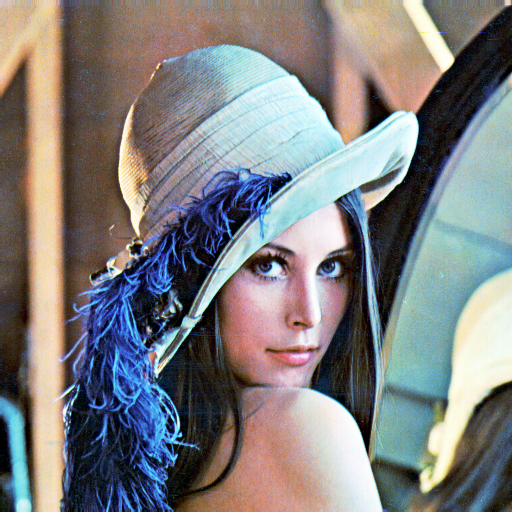

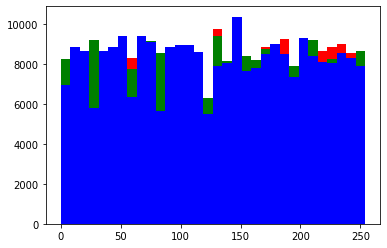

In [ ]:
lena_color_uniform = lena_color.uniform_match()
lena_color_uniform.hist()
lena_color_uniform.as_img()

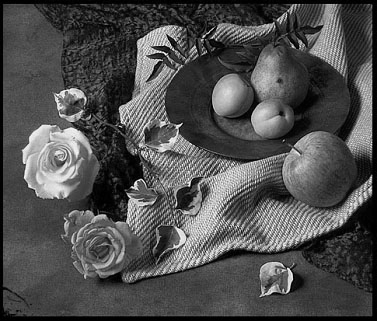

In [ ]:
fruit.as_img()

In [ ]:
lenamatch = lena.match(fruit)

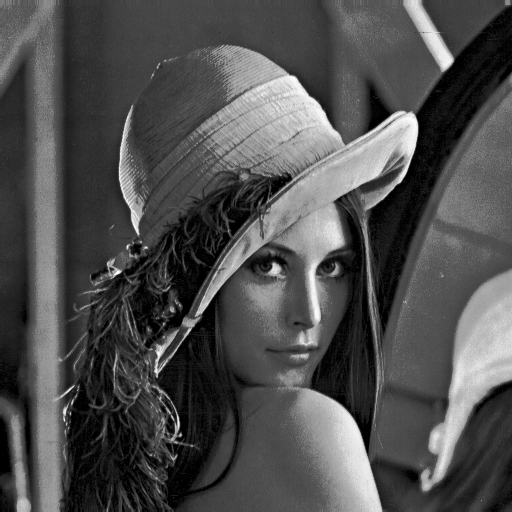

In [ ]:
lenamatch.as_img()

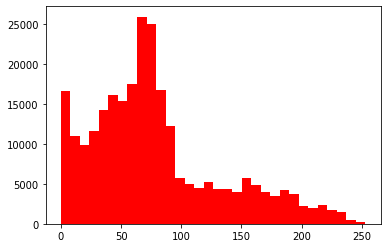

In [ ]:
lenamatch.hist()

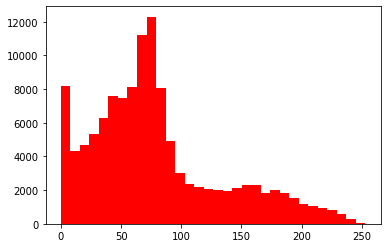

In [ ]:
fruit.hist()

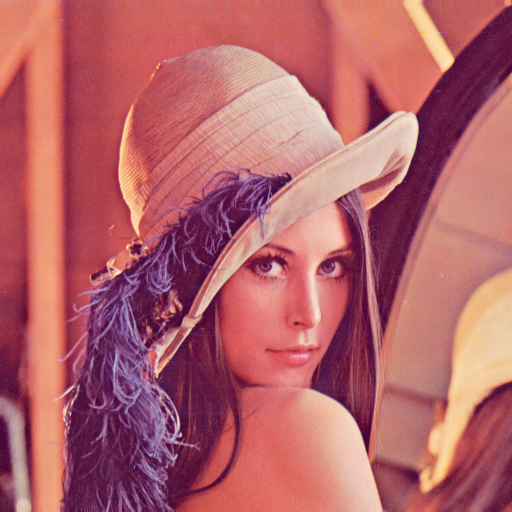

In [ ]:
lena_color.as_img()

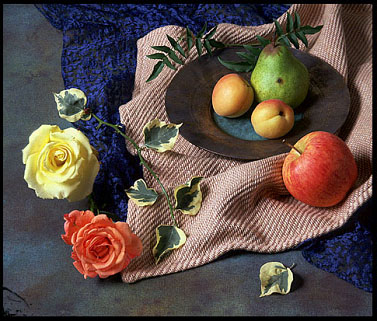

In [ ]:
fruit_color.as_img()

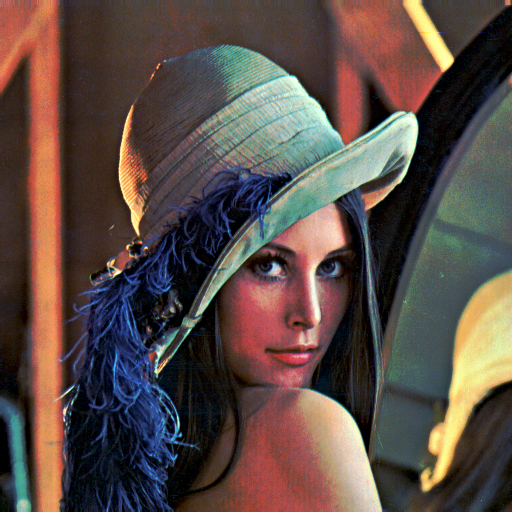

In [ ]:
lena_color_match = lena_color.match(fruit_color)
lena_color_match.as_img()

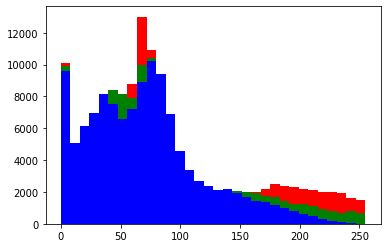

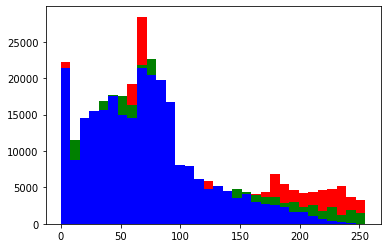

In [ ]:
fruit_color.hist()
plt.show()
lena_color_match.hist()

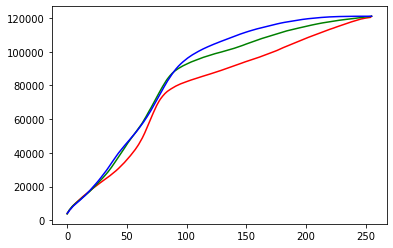

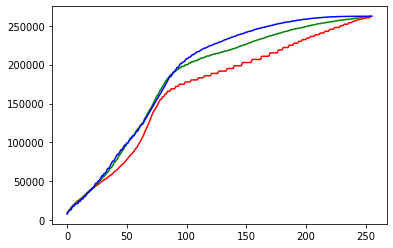

In [ ]:
fruit_color.plot_cumulative()
plt.show()
lena_color_match.plot_cumulative()

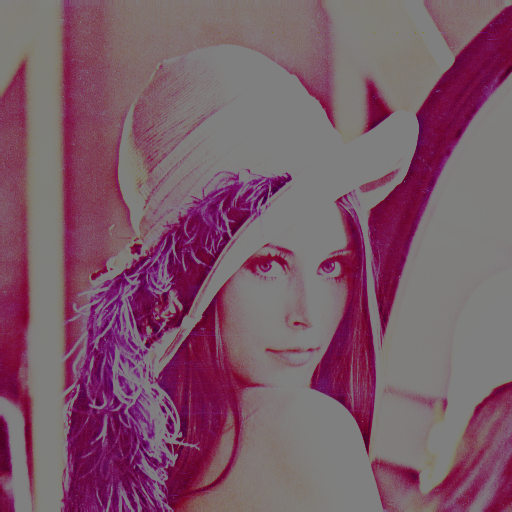

In [ ]:
lena_color.tanh_transform().as_img()

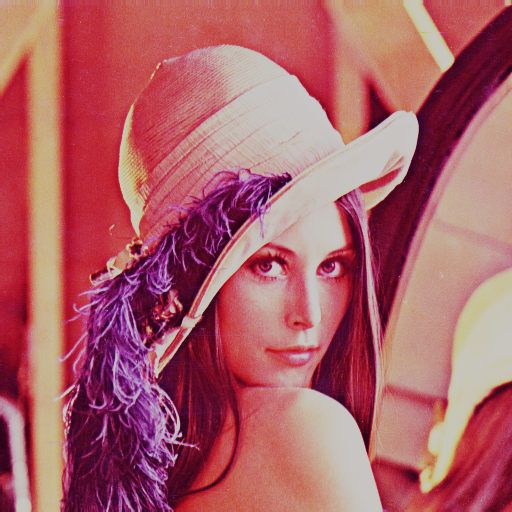

In [ ]:
lena_color.tanh_transform(200).as_img()

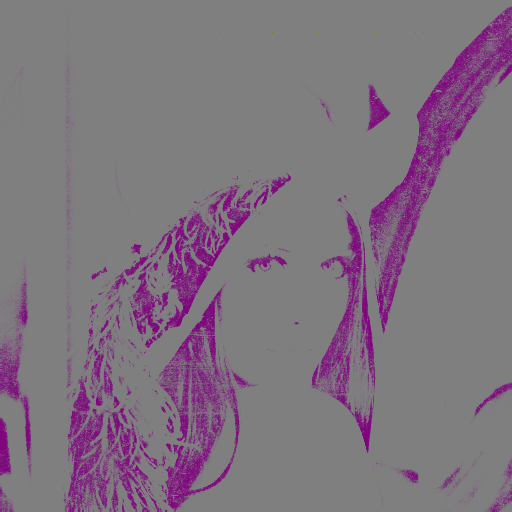

In [ ]:
lena_color.tanh_transform(scale=0.2).as_img()

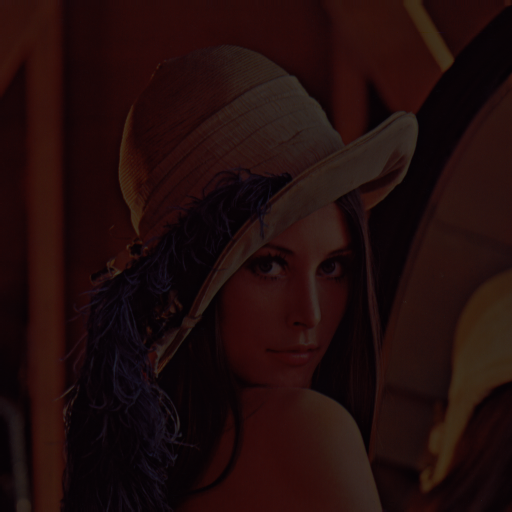

In [ ]:
lena_color.tanh_transform(scale=2).as_img()

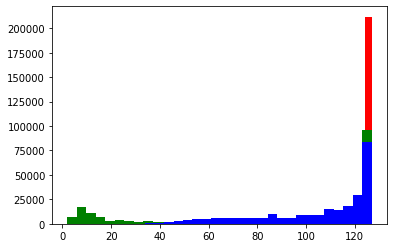

In [ ]:
lena_color.tanh_transform().hist()

$\frac{tanh((\frac{x}{0.5}-1)\cdot2)+1}{2}$

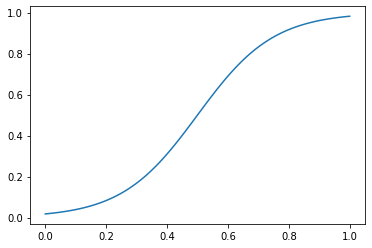

In [ ]:
x = np.linspace(0,1,100)
y = PrettyImage._t_tanh(x)
plt.plot(x,y)


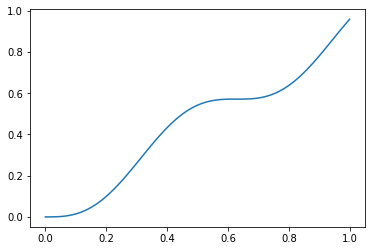

In [ ]:
x = np.linspace(0,1,100)
y = PrettyImage._xstep(x)
plt.plot(x,y)
#Con los valores originales de b1 y b2 la función cumple con 0<T(r)<L-1

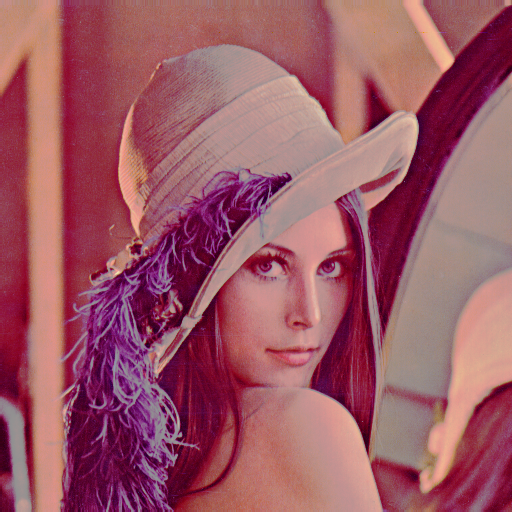

In [ ]:
lena_color.xstep_transform().as_img()

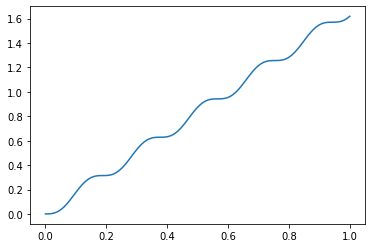

In [ ]:
x = np.linspace(0,1,100)
y = PrettyImage._xstep(x,b1=0.03,b2=20)
plt.plot(x,y)

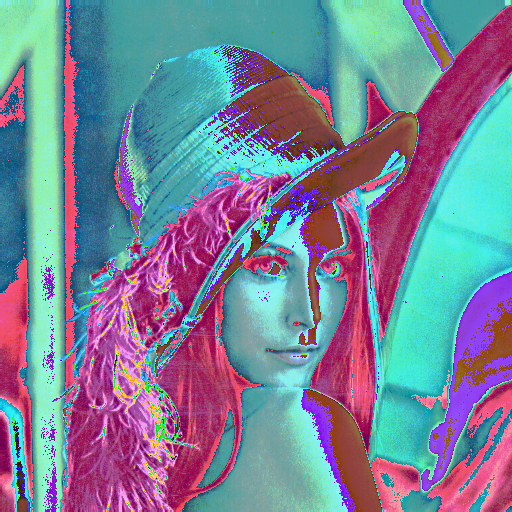

In [ ]:
lena_color.xstep_transform(b1=0.03,b2=20).as_img()

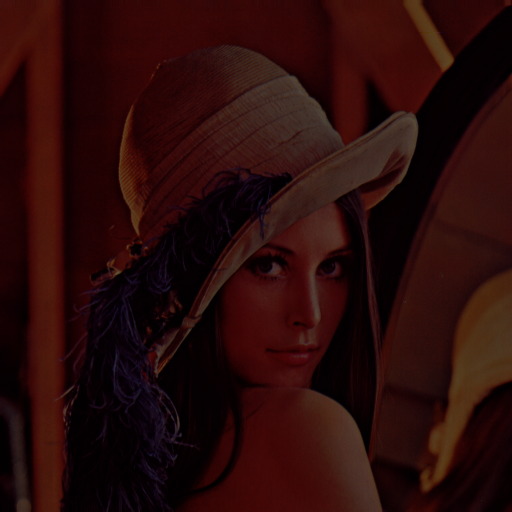

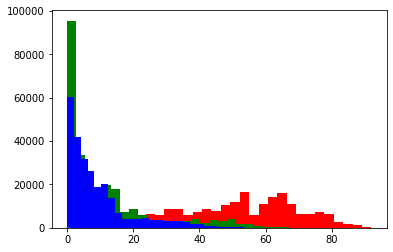

In [ ]:
b1,b2 = 0.5, 3
x = np.linspace(0,1,100)
y = PrettyImage._xstep(x,b1=b1,b2=b2)
plt.plot(x,y)
lena_color.xstep_transform(b1=b1,b2=b2).hist()
lena_color.xstep_transform(b1=b1,b2=b2).as_img()



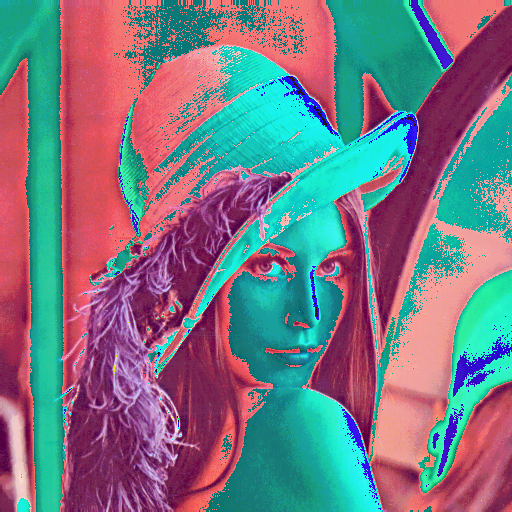

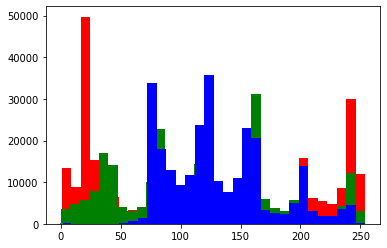

In [ ]:
b1,b2 = 0.02, 40
x = np.linspace(0,1,100)
y = PrettyImage._xstep(x,b1=b1,b2=b2)
plt.plot(x,y)

lena_color.xstep_transform(b1=b1,b2=b2).hist()
lena_color.xstep_transform(b1=b1,b2=b2).as_img()


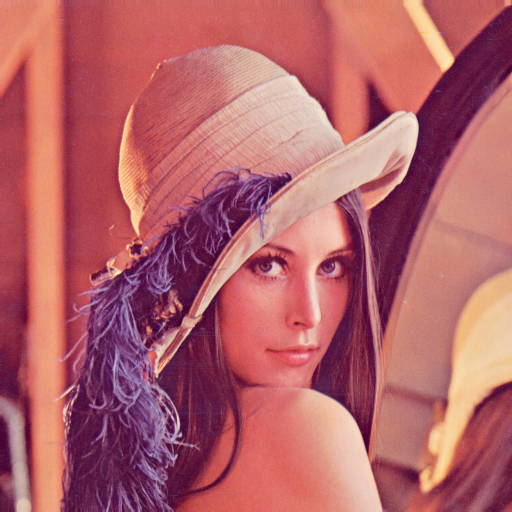

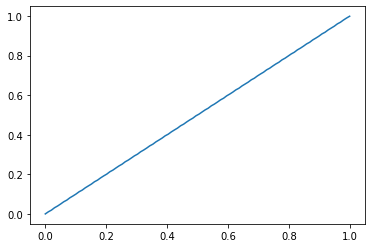

In [ ]:
b1,b2 = 0.001, 1000
x = np.linspace(0,1,100)
y = PrettyImage._xstep(x,b1=b1,b2=b2)
plt.plot(x,y)
lena_color.xstep_transform(b1=b1,b2=b2).as_img()


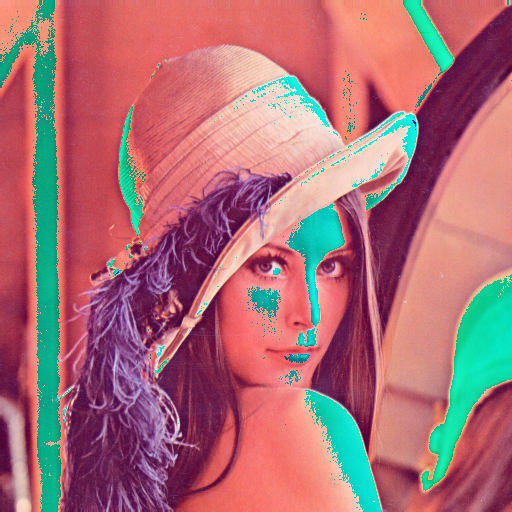

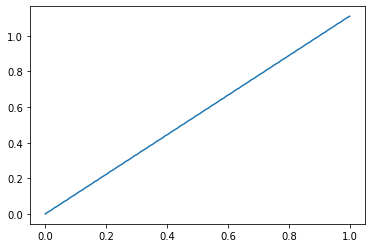

In [ ]:
b1,b2 = 0.001, 900
x = np.linspace(0,1,100)
y = PrettyImage._xstep(x,b1=b1,b2=b2)
plt.plot(x,y)
lena_color.xstep_transform(b1=b1,b2=b2).as_img()


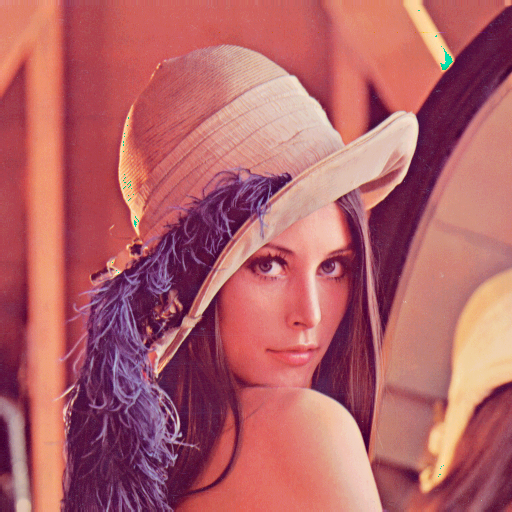

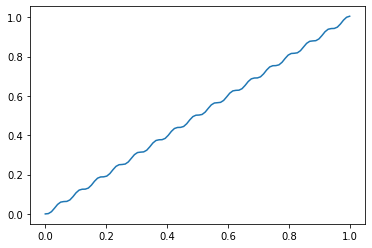

In [ ]:
b1,b2 = 0.01, 100
x = np.linspace(0,1,100)
y = PrettyImage._xstep(x,b1=b1,b2=b2)
plt.plot(x,y)
lena_color.xstep_transform(b1=b1,b2=b2).as_img()


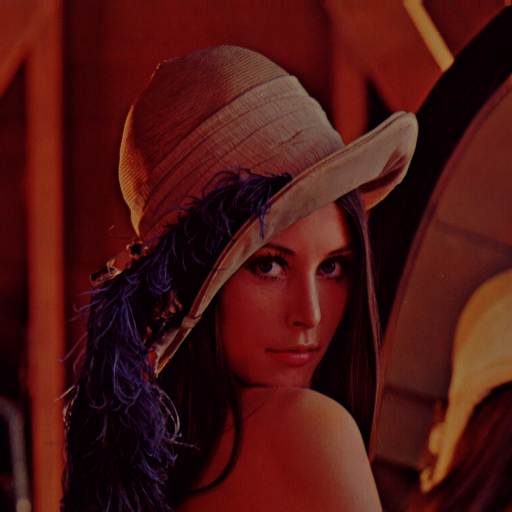

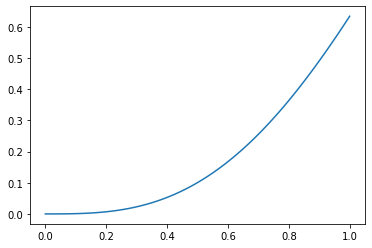

In [ ]:
b1,b2 = 0.4, 3
x = np.linspace(0,1,100)
y = PrettyImage._xstep(x,b1=b1,b2=b2)
plt.plot(x,y)
lena_color.xstep_transform(b1=b1,b2=b2).as_img()

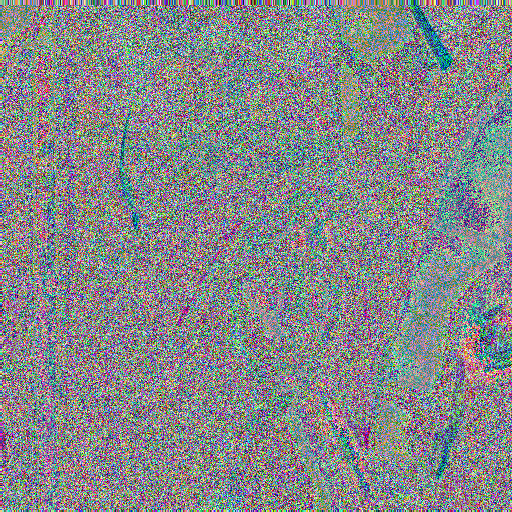

In [ ]:
b1,b2 = 0.00005, 100
f = lambda x: x**2-x
lena_color.apply_normalized_function(f).as_img()

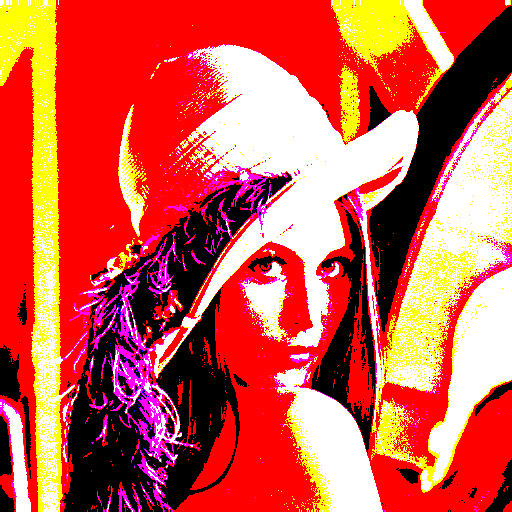

In [ ]:
b1,b2 = 0.00005, 100
f = lambda x: np.where(x, x>120, 0)
lena_color.apply_normalized_function(f).as_img()

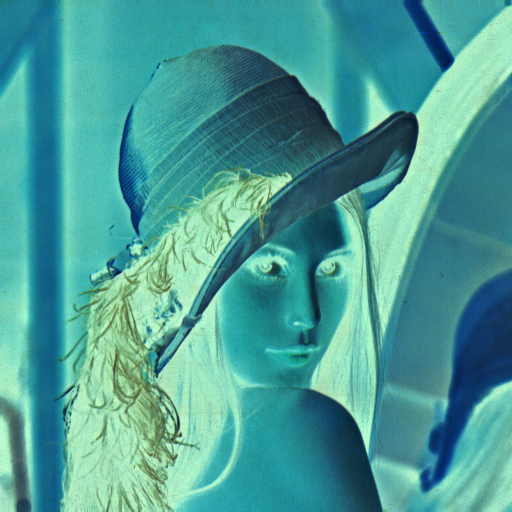

In [ ]:
b1,b2 = 0.00005, 100
f = lambda x: 255-x
lena_color.apply_normalized_function(f).as_img()

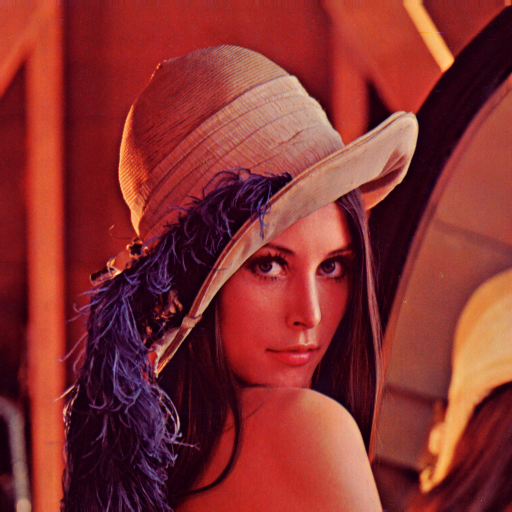

In [ ]:
b1,b2 = 0.00005, 100
f = lambda x: x**1.9999-x #???
lena_color.apply_normalized_function(f).as_img()